Once again, the first thing to do is to load the libraries. The list here is longer since more things will be done during this part of the analysis.

In [ ]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
#plt.style.use('dark_background')
import seaborn as sns
import contextily as cx
import geoplot as gplt
from shapely.geometry import Point
import mapclassify as mc
import osmnx as ox
import networkx as nx
import warnings
warnings.filterwarnings('ignore')
import walkscore as ws
from geopy.geocoders import Nominatim
import numpy as np
from time import sleep
#pip install python-dotenv
from dotenv import load_dotenv
from os import getenv
load_dotenv()
%matplotlib inline

We load the OSM data and immediately plot it on the map of the city:

In [2]:
osm_points_of_interest = gpd.read_file("../dataset/dati_open_street.geojson")

In [3]:
def saveImage(ax, title, filename, keep_axis=False, fontsize=25):
    if not keep_axis:
        ax.set_axis_off()
    ax.set_title(title, fontdict={"fontsize": fontsize, "fontweight" : "3"})
    ax.get_figure().savefig(f'../images/{filename}.png', dpi=150, bbox_inches='tight')
    return ax

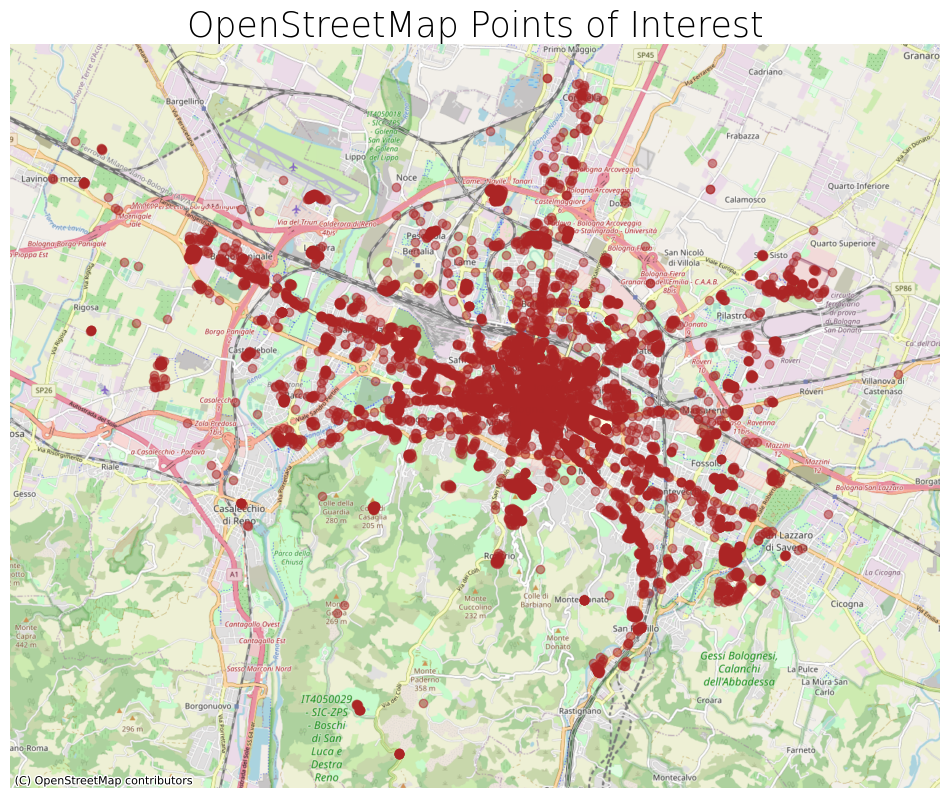

In [4]:
ax = osm_points_of_interest.to_crs(epsg=3857).plot(figsize=(12, 12), alpha=0.5, color="#AB2525")
cx.add_basemap(ax, source=cx.providers.OpenStreetMap.Mapnik)
ax = saveImage(ax, "OpenStreetMap Points of Interest", "osm_interest")
plt.show()

Seeing the data plotted allows us to notice that, unsurprisingly, most of the amenities are very concentrated in the city centre. We load the two remaining datasets and create a grouped version of the population one to have one single measure of the amount of people living in a single statistical area: 

In [18]:
statistical_areas = gpd.read_file("../dataset/aree-statistiche.geojson")
population_2021 = gpd.read_file("../dataset/population_2021.geojson")
population_summary = population_2021.groupby('codice_area_statistica').sum().reset_index()
population_summary['geometry'] = statistical_areas['geometry']
population_summary = gpd.GeoDataFrame(population_summary, crs=statistical_areas.crs, geometry=population_summary['geometry'])

<GeoAxesSubplot: title={'center': 'Residents in Bologna'}>

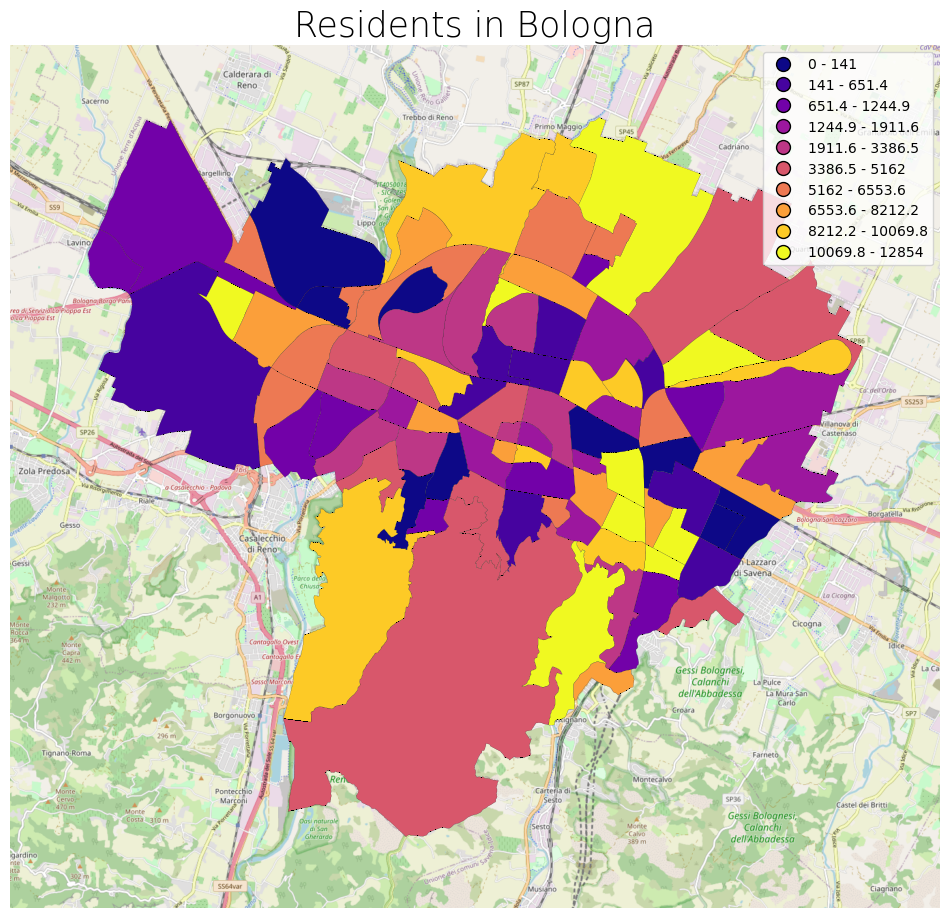

In [20]:
scheme = mc.Quantiles(population_summary['residenti'], k=10)
ax = gplt.webmap(population_summary, projection=gplt.crs.WebMercator(), figsize=(12,12))
gplt.choropleth(population_summary, 
    hue="residenti",
    linewidth=.1,
    scheme=scheme, cmap='plasma',
    alpha=1,
    legend=True,
    edgecolor='black',
    ax=ax,
)
ax = saveImage(ax, "Residents in Bologna", "residents")
plt.show()

It is clear from this visualization that most people do not live in the very centre of the city, but rather in the outskirts. Given this fact, we will first analyze the 15 minute accessibility starting from the center of the city, and then we will repeat the process for every single statistical area and see if there are areas that need more services.

We check if the centroid and representative point of the whole area are the same:

In [16]:
statistical_areas.dissolve().centroid

0    POINT (11.33343 44.49799)
dtype: geometry

In [17]:
statistical_areas.dissolve().representative_point()

0    POINT (11.36959 44.48865)
dtype: geometry

They are not. We plot them together to see how different they really are:

<AxesSubplot: title={'center': 'Centroid vs representative point'}>

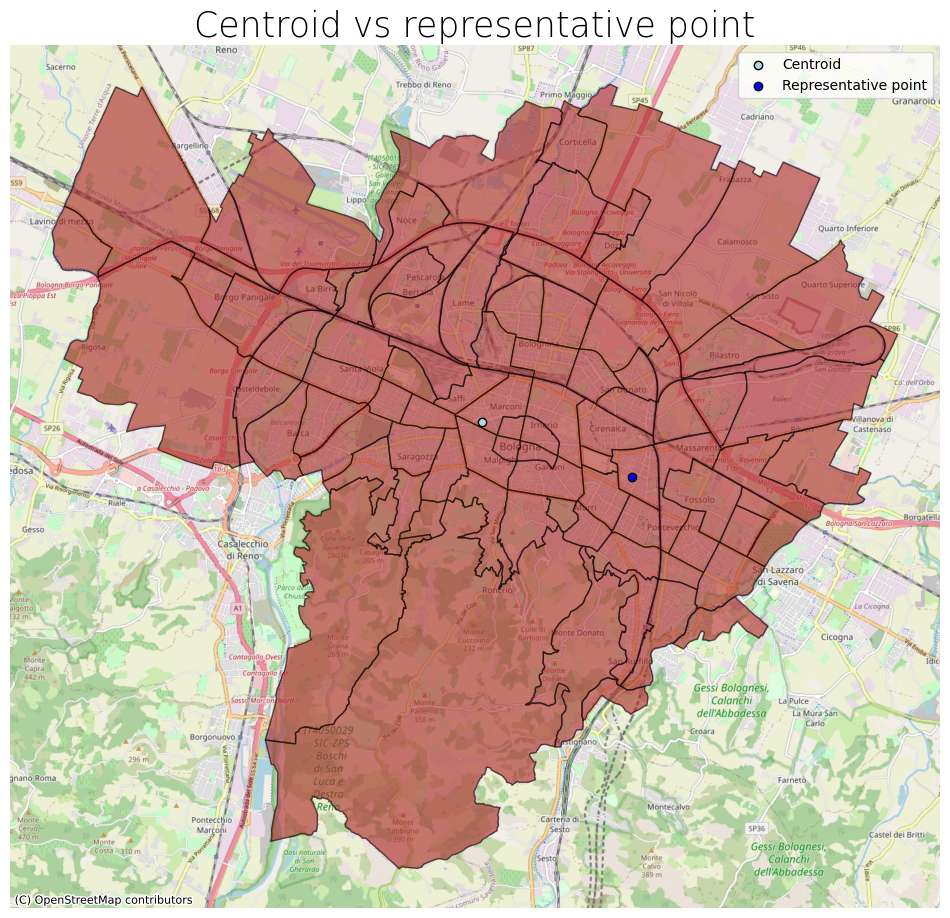

In [26]:
fig,ax = plt.subplots(1,1,sharex=True,sharey=True,figsize=(12,12))

statistical_areas.to_crs(epsg=3857).plot(ax=ax, alpha=0.6, color="#AB2525", edgecolor="black")
statistical_areas.dissolve().centroid.to_crs(epsg=3857).plot(ax=ax, color="lightblue", edgecolor="black", label="Centroid")
statistical_areas.dissolve().representative_point().to_crs(epsg=3857).plot(ax=ax, color="blue", edgecolor="black", label="Representative point")
ax.legend(loc="upper right")
cx.add_basemap(ax, source=cx.providers.OpenStreetMap.Mapnik)

ax = saveImage(ax, "Centroid vs representative point", "centroid_repr")
plt.show()

The difference between the two is quite important. In this case, the centroid is more representative of the actual centre of the city, so we will use that to analyze the 15 minute accessibility:

In [19]:
travel_times = [5,10,15]
travel_speed = 4

G = ox.graph_from_place("Bologna", network_type="walk")
G_proj = ox.project_graph(G)

meters_per_minute = travel_speed * 1000 / 60
for orig, dest, p, data in G_proj.edges(data=True, keys=True):
    data["time"] = data["length"] / meters_per_minute

In [20]:
isochrone_polys = []
centroid_statistical_area = ox.distance.nearest_nodes(G,Y=statistical_areas.dissolve().centroid.geometry[0].y,X=statistical_areas.dissolve().centroid.geometry[0].x)
for trip_time in sorted(travel_times, reverse=True):
    subgraph = nx.ego_graph(G_proj, centroid_statistical_area, radius=trip_time, distance="time")
    node_points = [Point((data["x"], data["y"])) for node, data in subgraph.nodes(data=True)]
    bounding_poly = gpd.GeoSeries(node_points).unary_union.convex_hull
    isochrone_polys.append(bounding_poly)

In [21]:
crs_proj = ox.graph_to_gdfs(G_proj)[0].crs

data = {'trip_time': sorted(travel_times, reverse=True), 'geometry': isochrone_polys}
isochrones = gpd.GeoDataFrame(data,crs=crs_proj)
isochrones.to_crs(epsg=4326, inplace=True)

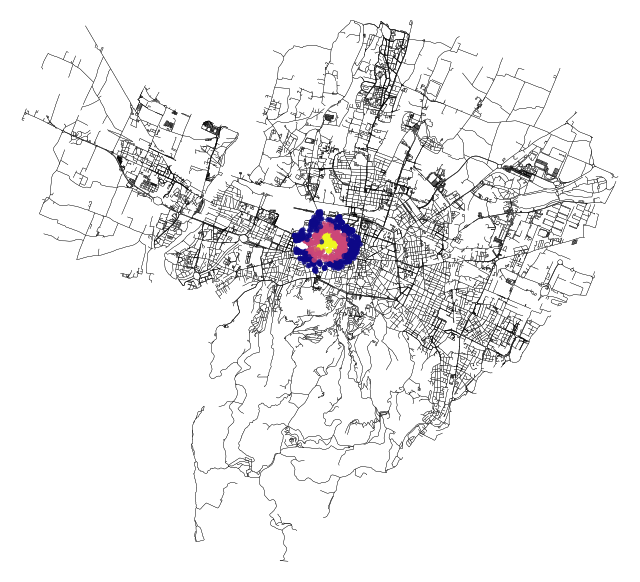

(<Figure size 800x800 with 1 Axes>, <AxesSubplot: >)

In [41]:
iso_colors = ox.plot.get_colors(n=len(travel_times), cmap='plasma', start=0, return_hex=True)
node_colors = {}
for trip_time, color in zip(sorted(travel_times, reverse=True), iso_colors):
    subgraph = nx.ego_graph(G_proj, centroid_statistical_area, radius=trip_time,  distance='time')
    for node in subgraph.nodes():
        node_colors[node] = color
node_color = [node_colors[node] if node in node_colors else 'none' for node in G_proj.nodes()]
node_size = [15 if node in node_colors else 0 for node in G_proj.nodes()]

#ax = ox.plot_graph(G_proj, node_color=node_color, node_size=node_size, node_alpha=0.8, node_zorder=2, bgcolor='k', edge_linewidth=0.2, edge_color='#FFFFFF')
ax = ox.plot_graph(G_proj, node_color=node_color, node_size=node_size, node_alpha=0.8, node_zorder=2, bgcolor='white', edge_linewidth=0.2, edge_color='black')
plt.show()

In [40]:
ax[1].set_title("Isochrones", fontdict={"fontsize": "25", "fontweight" : "3"})
ax[1].set_axis_off()
ax[1].set_facecolor("#FFFFFF")
ax[1].get_figure().savefig(f'../images/isochrones.png', dpi=300, bbox_inches='tight')

The outer blue layer represents the 15 minute travel distance by walking, the reddish layer is 10 minutes and the inner yellow layer is 5 minutes. By looking at this visualization, we can see that in 15 minute we can reach quite a big area of the city centre, but it is still not very informative. It's better to check the amenities available in that area:

<AxesSubplot: title={'center': 'Isochrones for the centroid with POIs'}>

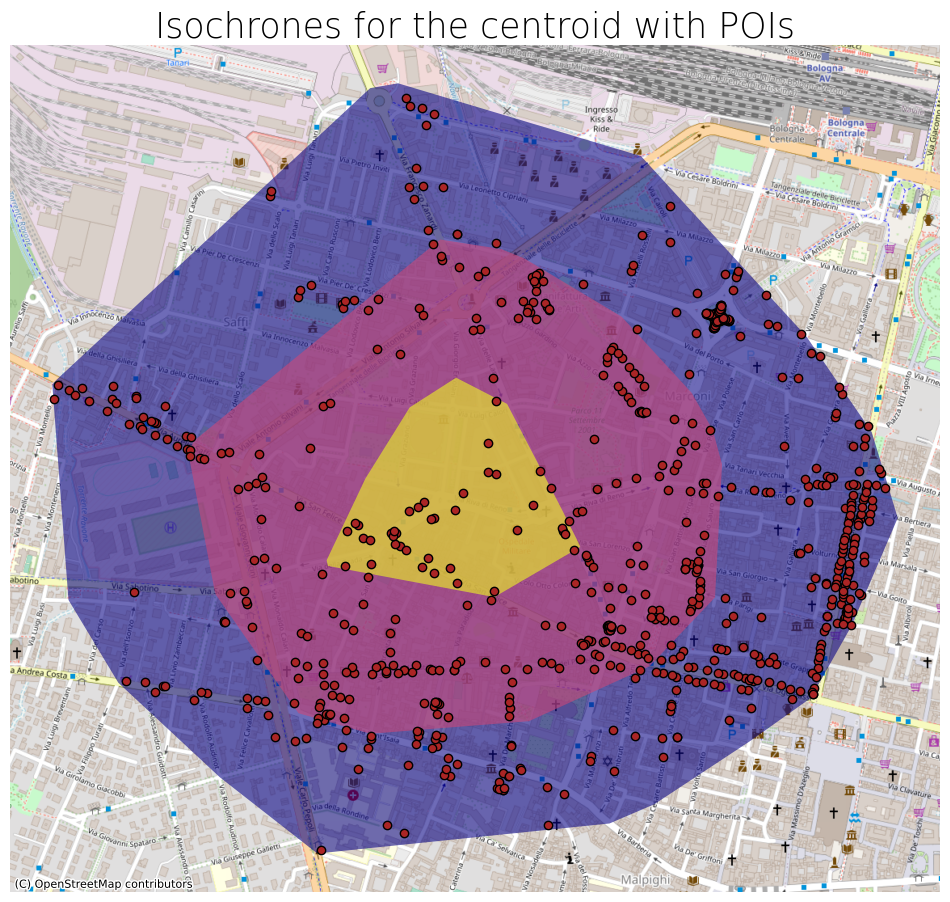

In [42]:
contained_activities = osm_points_of_interest[osm_points_of_interest.geometry.within(isochrones.geometry.iloc[0])]

fig,ax = plt.subplots(1,1,sharex=True,sharey=True,figsize=(12,12))

isochrones.to_crs(epsg=3857).plot(ax=ax, alpha=0.6, cmap='plasma')
contained_activities.to_crs(epsg=3857).plot(ax=ax, color="#AB2525", edgecolor="black")
cx.add_basemap(ax, source=cx.providers.OpenStreetMap.Mapnik)

ax = saveImage(ax, "Isochrones for the centroid with POIs", "isochrones_centroid")
plt.show()

As we can see, lots of places are accessible within 15 minutes, and even within 10 minutes. We can check what kinds of amenities are included. The categories in the full OSM dataset are:

In [44]:
print(", ".join(osm_points_of_interest.categoria.unique()))

alimentari, commercio, intrattenimento, istruzione, poste e banche, ristorazione, salute


Those contained within the 15 minutes from the center are:

In [45]:
print(", ".join(contained_activities.categoria.unique()))

alimentari, commercio, intrattenimento, istruzione, poste e banche, ristorazione, salute


So far so good. Now let's check the tags. Since some amenities don't have a tag, we will filter only the valid ones. The complete list is:

In [46]:
print(", ".join([tag for tag in osm_points_of_interest.tag.unique() if tag is not None]))

alcohol, bakery, beverages, butcher, coffee, confectionery, convenience, dairy, deli, department_store, farm, greengrocer, kiosk, mall, pasta, pastry, seafood, supermarket, agrarian, bag, bathroom_furnishing, beauty, bed, bicycle, bookmaker, books, car, car_parts, car_repair, chemist, clothes, computer, cosmetics, doityourself, dry_cleaning, electronics, fabric, florist, funeral_directors, furniture, garden_centre, gift, hairdresser, hardware, herbalist, hifi, houseware, jewelry, laundry, lighting, medical_supply, mobile_phone, motorcycle, music, newsagent, nutrition_supplements, optician, pawnbroker, perfumery, pet, photo, radiotechnics, stationery, tattoo, ticket, tobacco, toys, travel_agency, vacant, variety_store, video_games, arts_centre, cinema, community_centre, fountain, theatre, college, driving_school, kindergarten, music_school, school, university, atm, bank, bureau_de_change, post_office, bar, cafe, fast_food, ice_cream, pub, restaurant, clinic, dentist, doctors, hospital, 

The contained list is:

In [47]:
print(", ".join([tag for tag in contained_activities.tag.unique() if tag is not None]))

alcohol, bakery, confectionery, convenience, deli, pasta, supermarket, bookmaker, books, car, clothes, computer, cosmetics, florist, furniture, gift, hairdresser, houseware, jewelry, kiosk, laundry, motorcycle, music, optician, pet, tobacco, toys, arts_centre, cinema, school, university, bank, bar, cafe, fast_food, ice_cream, pub, restaurant, dentist, hospital, pharmacy, butcher, department_store, pastry, beauty, erotic, garden_centre, hardware, kitchen, mobile_phone, newsagent, stationery, ticket, travel_agency, variety_store, theatre, atm, post_office, doctors, beverages, tea, bag, bicycle, chemist, craft, dry_cleaning, perfumery, photo, community_centre, fountain, kindergarten, language_school


The list is shorter, but it looks like all the necessary activities are contained. This raises an important question: is there a way to quantify the adherence to the 15 minute city for a specific geographic location?

Fortunately, the answer is yes. Walk Score is a company that provides a walkability analysis of a geographic location. The free service allows 5000 calls to their API and returns a score for the location.

In [48]:
api_key = getenv('WALKSCORE_API_KEY')
walkscore = ws.WalkScoreAPI(api_key=api_key)
centroid_point = statistical_areas.dissolve().centroid.geometry[0]

result = walkscore.get_score(latitude = centroid_point.y, longitude = centroid_point.x)

print(f"{result.walk_score} - {result.walk_description}. More info at: {result.property_page_link}")

100 - Walker's Paradise. More info at: https://www.walkscore.com/score/loc/lat=44.49798545371725/lng=11.333432000897092/?utm_source=unitn.it&utm_medium=ws_api&utm_campaign=ws_api


The score returned for the centroid of Bologna is 100, with the description of "Walker's Paradise". We want to retrieve the score for all the statistical areas, so we try and understand whether the centroid of the areas is good enough:

<AxesSubplot: title={'center': 'Centroid of the statistical areas'}>

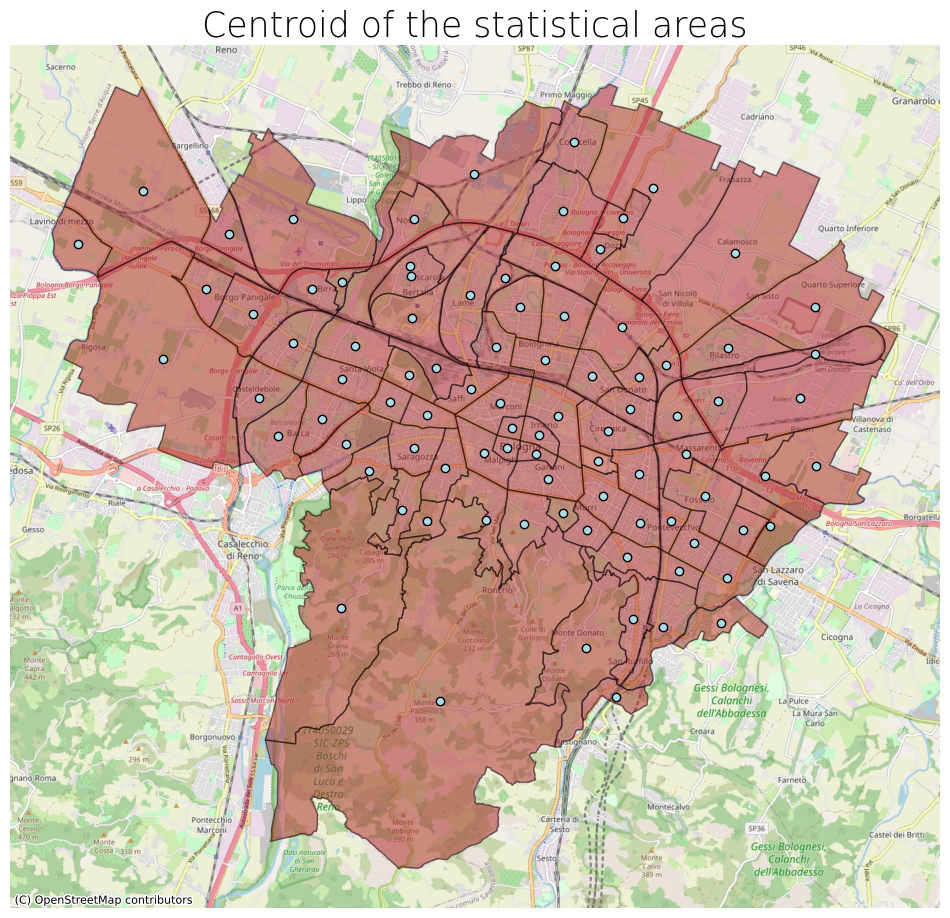

In [49]:
statistical_areas['centroid'] = statistical_areas.centroid

fig,ax = plt.subplots(1,1,sharex=True,sharey=True,figsize=(12,12))

statistical_areas.to_crs(epsg=3857).plot(ax=ax, figsize=(12, 12), alpha=0.5, color="#AB2525", edgecolor="black")
statistical_areas['centroid'].to_crs(epsg=3857).plot(ax=ax, color="lightblue", edgecolor="black")
cx.add_basemap(ax, source=cx.providers.OpenStreetMap.Mapnik)

ax = saveImage(ax, "Centroid of the statistical areas", "centroid_statistical_areas")
plt.show()

As we can see, the centroid is not a good choice in this case. Some areas have the centroid that is either on the border with other areas or completely outside the area. We try again, but with the representative points:

<AxesSubplot: title={'center': 'Representative point of the statistical areas'}>

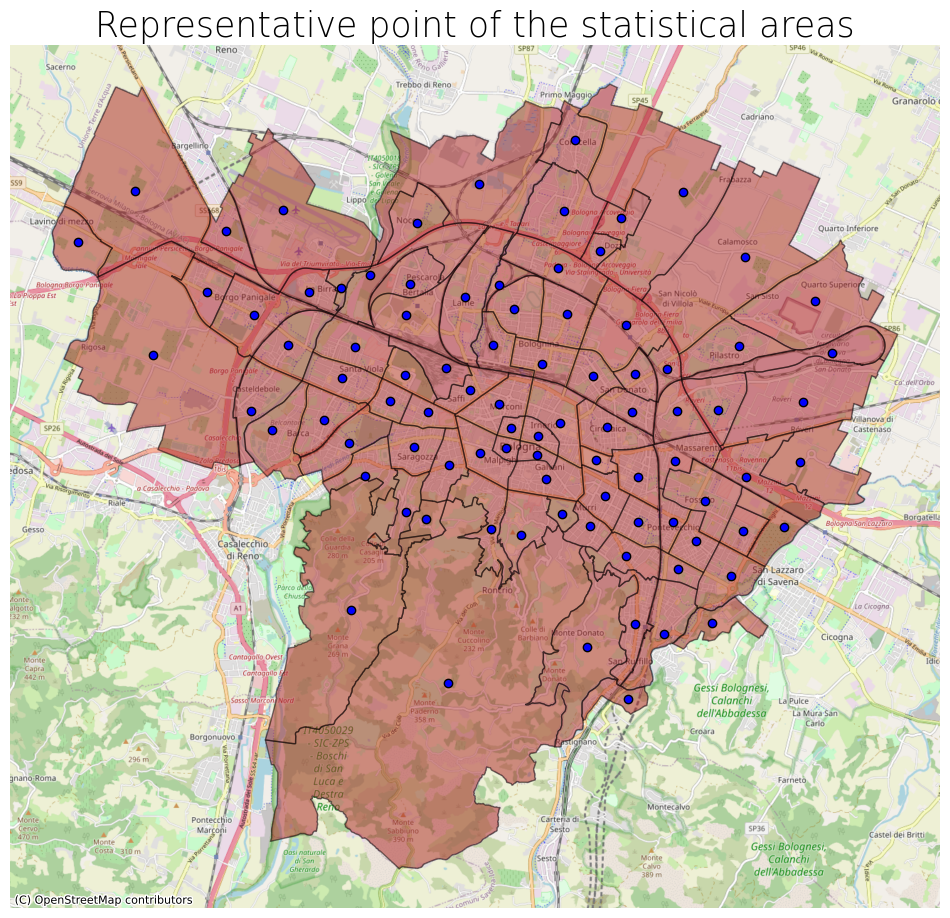

In [50]:
statistical_areas['representative_point'] = statistical_areas.geometry.representative_point()
fig,ax = plt.subplots(1,1,sharex=True,sharey=True,figsize=(12,12))

statistical_areas.to_crs(epsg=3857).plot(ax=ax, figsize=(12, 12), alpha=0.5, color="#AB2525", edgecolor="black")
statistical_areas['representative_point'].to_crs(epsg=3857).plot(ax=ax, color="blue", edgecolor="black")
cx.add_basemap(ax, source=cx.providers.OpenStreetMap.Mapnik)

ax = saveImage(ax, "Representative point of the statistical areas", "representative_point_statistical_areas")
plt.show()

The result here is much better, with the points that are all within the border of the areas. Now that we know to use the representative points, we can start to fetch the information from the API for all the points and calculate some basic statistics:

In [51]:
walk_scores = []
for index, row in statistical_areas.iterrows():
    try:
        result = walkscore.get_score(latitude = row['representative_point'].y, longitude = row['representative_point'].x)
        walk_scores.append(result.walk_score)
    except:
        walk_scores.append(-1)
    sleep(1)
    

statistical_areas['walk_score'] = walk_scores

true_scores = [score for score in walk_scores if score != -1]
print(f"Mean score: {np.mean(true_scores)}\nMedian score: {np.median(true_scores)}\nMax score: {np.max(true_scores)}\nMin score: {np.min(true_scores)}")

Mean score: 69.85555555555555
Median score: 80.5
Max score: 100
Min score: 3


The mean is quite different from the median. This could indicate that the distribution of the scores is skewed. We try to check whether all values were successfully fetched or not:

In [52]:
print(f"Total statistical areas number: {len(walk_scores)}\nStatistical areas with invalid scores: {len([score for score in walk_scores if score == -1])}")

Total statistical areas number: 90
Statistical areas with invalid scores: 0


Luckily, all of them were fetched. Let's check the distribution and see if there is any problem:

<AxesSubplot: title={'center': 'Walk Score Distribution'}, xlabel='Walk Score', ylabel='Frequency'>

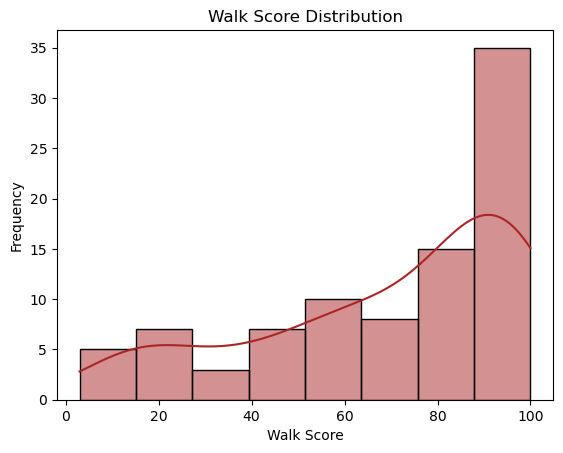

In [53]:
score_plot = sns.histplot(true_scores, color="#AB2525", kde=True)
score_plot.set_xlabel('Walk Score')
score_plot.set_ylabel('Frequency')
score_plot.set_title('Walk Score Distribution')
score_plot.get_figure().savefig(f'../images/walk_score_distribution.png', dpi=150, bbox_inches='tight')
plt.show()

Our intuition was correct and the data is skewed. Luckily, this means that the majority of the areas have a high score. We can plot the score in a similar way to what we did for the resident number mapping:

<GeoAxesSubplot: title={'center': 'Walk score for the statistical areas in Bologna'}>

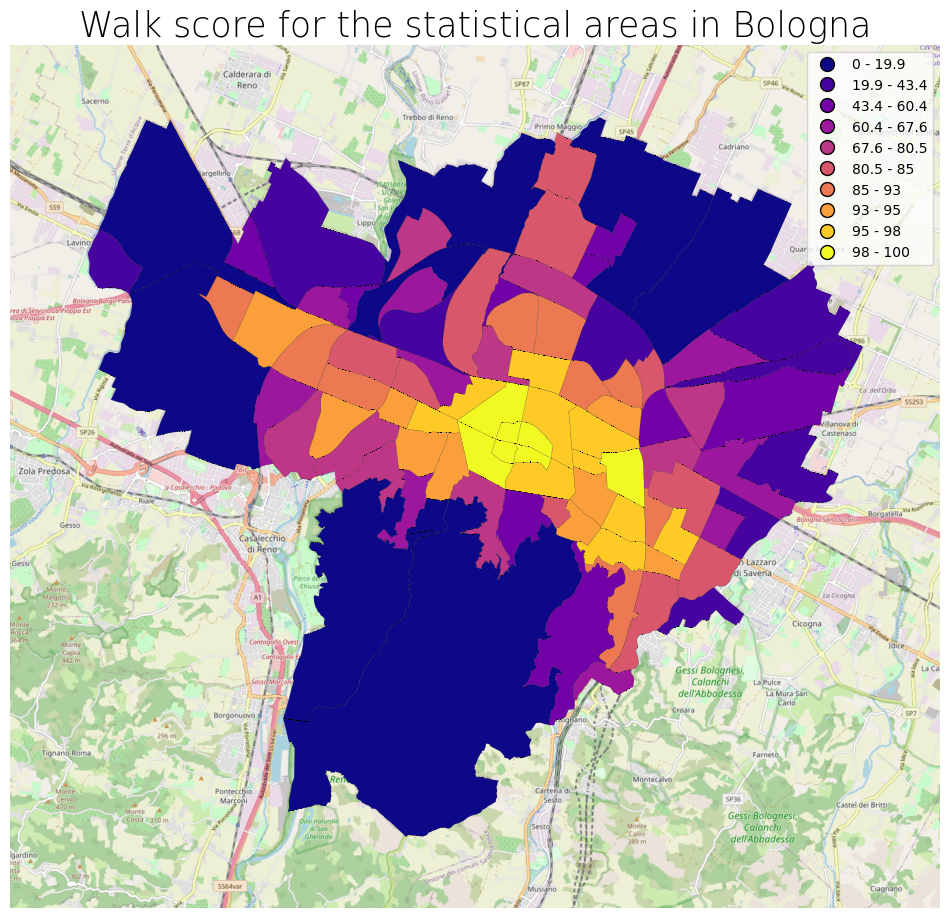

In [54]:
scheme = mc.Quantiles(statistical_areas['walk_score'], k=10)
ax = gplt.webmap(statistical_areas, projection=gplt.crs.WebMercator(), figsize=(12,12))
gplt.choropleth(statistical_areas, 
    hue="walk_score",
    linewidth=.1,
    scheme=scheme, cmap='plasma',
    alpha=1,
    legend=True,
    edgecolor='black',
    ax=ax,
)
ax = saveImage(ax, "Walk score for the statistical areas in Bologna", "walk_score_statistical_areas")
plt.show()

The areas with the highest walk scores are situated in the center of the city and the farther they get from the center, the lower the score gets. Looking at the map, there could be some correlation among adjacent areas. We will explore this later on during the spatial analysis. For now, we can compare this map with both the number of residents and the location of amenities:

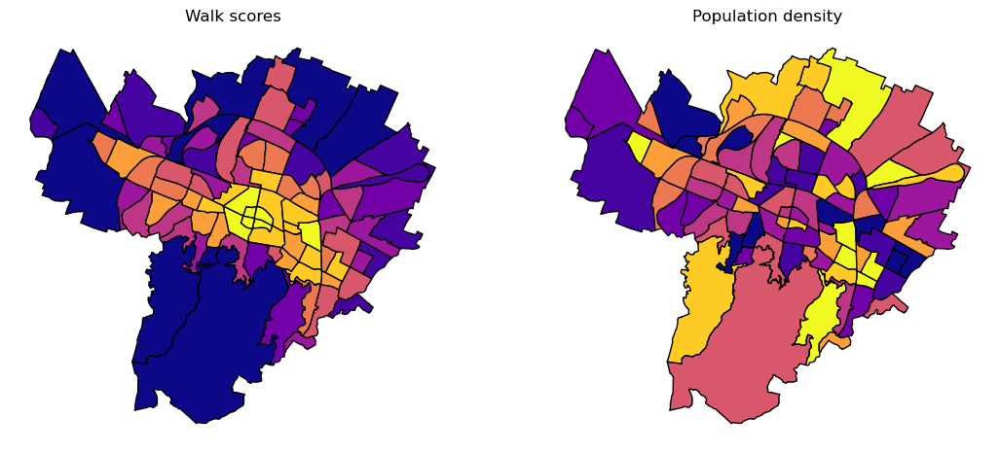

In [57]:
f, axs = plt.subplots(1, 2, figsize=(13, 13))
ax1, ax2 = axs

statistical_areas.plot(
    column='walk_score',
    cmap='plasma',
    scheme='quantiles',
    k=10,
    edgecolor='black',
    legend=False,
    ax=ax1
)
ax1.set_axis_off()
ax1.set_title("Walk scores")

population_summary.plot(
    column='residenti',
    cmap='plasma',
    scheme='quantiles',
    k=10,
    edgecolor='black',
    legend=False,
    ax=ax2
)
ax2.set_axis_off()
ax2.set_title("Population density")

f.savefig(f'../images/walk_score_population_density.png', dpi=150, bbox_inches='tight')
plt.show()

The colors have the same meaning as before, but the legend was not included as it takes up too much space. As we can observe, the most densely populated areas on the outskirts of the city do not really have a good score. So, while the very center of the city mostly respects the 15 minute city concept, a lot of the people living in Bologna do not really benefit from it. We can check the correlation between the walk score and the number of residents:

In [58]:
population_summary['walk_score'] = statistical_areas['walk_score']
population_summary['walk_score'].corr(population_summary['residenti'], method='kendall')

0.04478682635765169

The two parameters are very slightly correlated. The number of residents does not influence the walkability of the place.

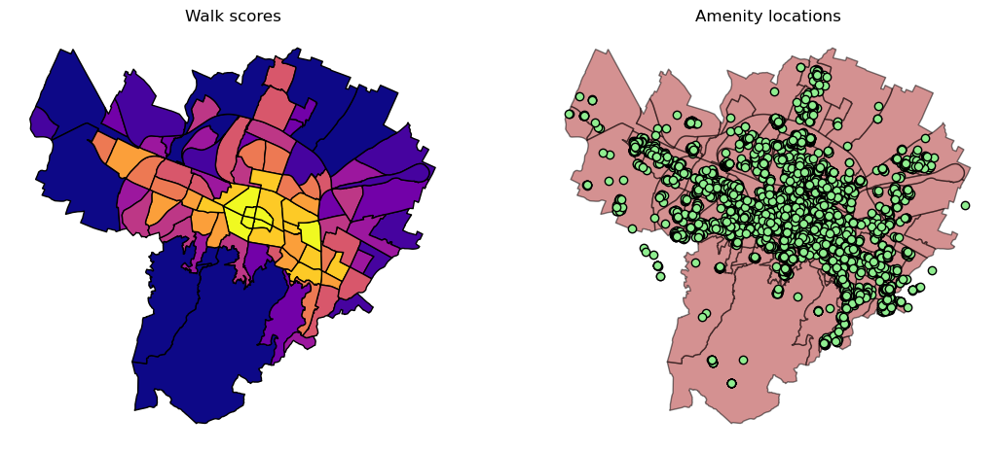

In [8]:
f, axs = plt.subplots(1, 2, figsize=(13, 13))
ax1, ax2 = axs

statistical_areas.plot(
    column='walk_score',
    cmap='plasma',
    scheme='quantiles',
    k=10,
    edgecolor='black',
    legend=False,
    ax=ax1
)
ax1.set_axis_off()
ax1.set_title("Walk scores")

statistical_areas.to_crs(epsg=3857).plot(ax=ax2, figsize=(12, 12), alpha=0.5, color="#AB2525", edgecolor="black")
osm_points_of_interest.to_crs(epsg=3857).plot(ax=ax2, color="lightgreen", edgecolor="black")
ax2.set_axis_off()
ax2.set_title("Amenity locations")

f.savefig(f'../images/walk_score_amenities.png', dpi=150, bbox_inches='tight')

plt.show()

By comparing the walk scores with the amenities on the territory, there seems to be much higher correlation between them. It makes sense, since the walk score takes into account how reachable the various places are from the locations. For each area, we extract the number of amenities within and check the correlation with the walk score:

In [60]:
isochrone_polys_all_areas = []
total_amenities = []

for index, row in statistical_areas.iterrows():
    total_amenities.append(len(osm_points_of_interest[osm_points_of_interest.geometry.within(statistical_areas.geometry[index])]))
    centroid_statistical_area = ox.distance.nearest_nodes(G,Y=row['representative_point'].y,X=row['representative_point'].x)
    isochrone_polys_all_areas.append([])
    for trip_time in sorted(travel_times, reverse=True):
        subgraph = nx.ego_graph(G_proj, centroid_statistical_area, radius=trip_time, distance="time")
        node_points = [Point((data["x"], data["y"])) for node, data in subgraph.nodes(data=True)]
        bounding_poly = gpd.GeoSeries(node_points).unary_union.convex_hull
        isochrone_polys_all_areas[index].append(bounding_poly)

for i in range(len(isochrone_polys_all_areas)):
    data = {'trip_time': sorted(travel_times, reverse=True), 'geometry': isochrone_polys_all_areas[i]}
    isochrones_area = gpd.GeoDataFrame(data,crs=crs_proj).to_crs(epsg=4326)
    isochrone_polys_all_areas[i] = isochrones_area.geometry

In [61]:
within_5_minutes = []
within_10_minutes = []
within_15_minutes = []

for i in range(len(isochrone_polys_all_areas)):
    within_15_minutes.append(osm_points_of_interest[osm_points_of_interest.geometry.within(isochrone_polys_all_areas[i][0])].shape[0])
    within_10_minutes.append(osm_points_of_interest[osm_points_of_interest.geometry.within(isochrone_polys_all_areas[i][1])].shape[0])
    within_5_minutes.append(osm_points_of_interest[osm_points_of_interest.geometry.within(isochrone_polys_all_areas[i][2])].shape[0])

statistical_areas['within_5_minutes'] = within_5_minutes
statistical_areas['within_10_minutes'] = within_10_minutes
statistical_areas['within_15_minutes'] = within_15_minutes
statistical_areas['total_amenities'] = total_amenities

In [62]:
print(f"Correlation between:\n- amenitites within 5 minutes and walk score: {statistical_areas['within_5_minutes'].corr(statistical_areas['walk_score'], method='kendall')}\n- amenities within 10 minutes and walk score: {statistical_areas['within_10_minutes'].corr(statistical_areas['walk_score'], method='kendall')}\n- amenities within 15 minutes and walk score: {statistical_areas['within_15_minutes'].corr(statistical_areas['walk_score'], method='kendall')}\n- total amenities in the area and walk score: {statistical_areas['total_amenities'].corr(statistical_areas['walk_score'], method='kendall')}")

Correlation between:
- amenitites within 5 minutes and walk score: 0.6711101073595414
- amenities within 10 minutes and walk score: 0.7000209480691637
- amenities within 15 minutes and walk score: 0.7770196958423737
- total amenities in the area and walk score: 0.4448112784417848


In this case the correlation is much higher compared to the number of residents. With each increase in distance the correlation gets higher until the 15 minute mark, while the total number in the area is the least relevant measure of the group.

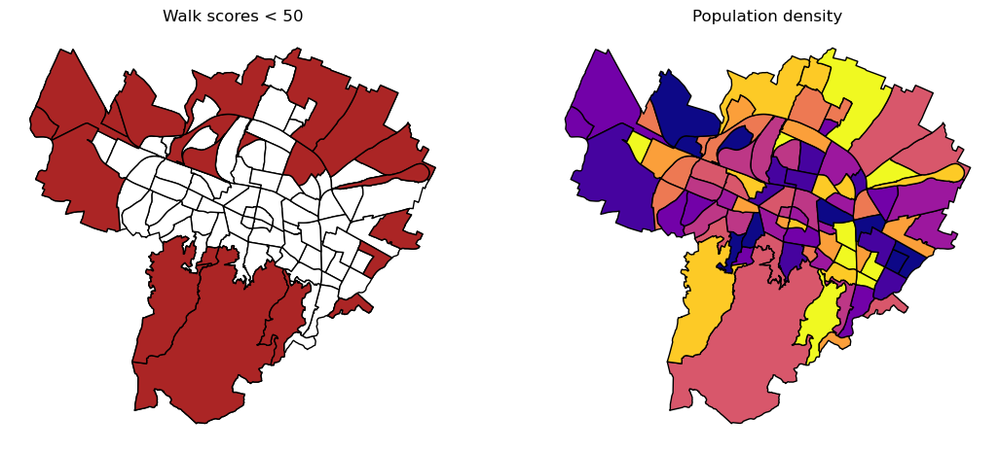

In [36]:
low_score = statistical_areas[statistical_areas.walk_score < 50]

f, axs = plt.subplots(1, 2, figsize=(13, 13))
ax1, ax2 = axs

statistical_areas.plot(ax=ax1, edgecolor='black', facecolor='w')
low_score.plot(ax=ax1, color='#AB2525', edgecolor='black')
ax1.set_axis_off()
ax1.set_title("Walk scores < 50")

population_summary.plot(
    column='residenti',
    cmap='plasma',
    scheme='quantiles',
    k=10,
    edgecolor='black',
    legend=False,
    ax=ax2
)
ax2.set_axis_off()
ax2.set_title("Population density")

f.savefig(f'../images/low_walk_score_areas.png', dpi=150, bbox_inches='tight')
plt.show()

In [41]:
print(low_score.within_5_minutes.max(), low_score.within_10_minutes.max(), low_score.within_15_minutes.max())

10 46 56


In [40]:
print(statistical_areas.within_5_minutes.max(), statistical_areas.within_10_minutes.max(), statistical_areas.within_15_minutes.max())

219 766 1494


In [64]:
industrial_areas = {
    "Z.I. Pieve di Cento": [],
    "Martignone": [],
    "Altedo": [],
    "Beni Comunali": [],
    "Bentivoglio": [],
    "Ca' De Fabbri Minerbio": [],
    "Cento di Budrio": [],
    "Il postrino di San Giovanni": [],
    "Imola": [],
    "Interporto-Funo-Stiatico": [],
    "Molinella": [],
    "Ponte Rizzoli": [],
    "San Carlo": [],
    "Tavernelle": [],
    "Lagaro - La Casellina": [],
    "Ca' di Landino": [],
    "Lagora": [],
    "Roncobilaccio": [],
    "Medicina": [],
}

geolocator = Nominatim(user_agent="Mozilla/5.0 (Windows NT 10.0; rv:108.0) Gecko/20100101 Firefox/108.0")

for area in industrial_areas:
    address = f"{area}, Bologna, Emilia-Romagna, Italy"
    query = geolocator.geocode(query=address)
    if query:
        industrial_areas[area] = [query.latitude, query.longitude]
    else:
        print(f"Could not find {area}")
    sleep(1)

Could not find Z.I. Pieve di Cento
Could not find Interporto-Funo-Stiatico
Could not find Lagaro - La Casellina


In [68]:
del industrial_areas["Z.I. Pieve di Cento"], industrial_areas["Interporto-Funo-Stiatico"], industrial_areas["Lagaro - La Casellina"]
new_areas = {
    "Interporto Funo": [],
    "Lagaro": []
}
industrial_areas.update(new_areas)

for area in new_areas:
    address = f"{area}, Bologna, Emilia-Romagna, Italy"
    query = geolocator.geocode(query=address)
    if query:
        industrial_areas[area] = [query.latitude, query.longitude]
    else:
        print(f"Could not find {area}")
    sleep(1)

In [69]:
query = geolocator.geocode(query="Z.I. Pieve di Cento")
industrial_areas["Z.I. Pieve di Cento"] = [query.latitude, query.longitude]

In [ ]:
industrial_areas = pd.DataFrame.from_dict(industrial_areas, orient='index', columns=['latitude', 'longitude'])
industrial_areas = gpd.GeoDataFrame(industrial_areas, geometry=gpd.points_from_xy(industrial_areas.longitude, industrial_areas.latitude), crs="EPSG:4326")

<AxesSubplot: title={'center': 'Locations of the industrial areas'}>

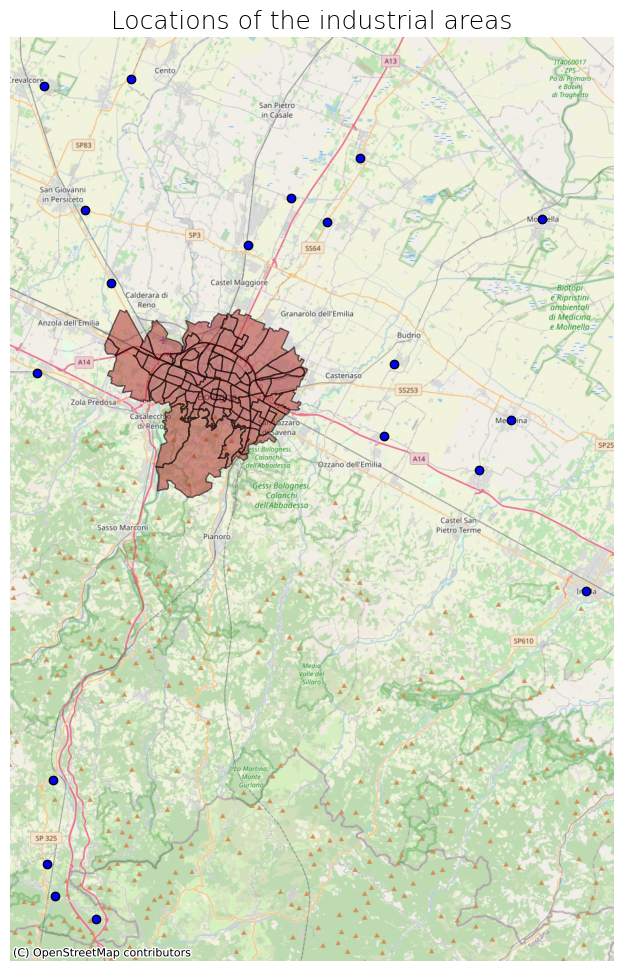

In [75]:
fig,ax = plt.subplots(1,1,sharex=True,sharey=True,figsize=(12,12))

statistical_areas.to_crs(epsg=3857).plot(ax=ax, figsize=(12, 12), alpha=0.5, color="#AB2525", edgecolor="black")
industrial_areas.to_crs(epsg=3857).plot(ax=ax, color="blue", edgecolor="black")
cx.add_basemap(ax, source=cx.providers.OpenStreetMap.Mapnik)

ax = saveImage(ax, "Locations of the industrial areas", "industrial_areas", fontsize=18)
plt.show()

To end this phase, we save the updated statistical areas file with all the new columns and proceed to the next phase. Since GeoPandas does not support multiple geometries in a file (https://github.com/geopandas/geopandas/issues/1490) we will drop the columns for the centroid and representative point and only keep the main geometry. Since we will move to R for the spatial analysis, we also save a CSV file with the coordinates for the representative point of each geometry.

In [63]:
statistical_areas.drop(['centroid', 'representative_point'], axis=1).to_file("../dataset/statistical_areas.geojson", driver='GeoJSON')

In [64]:
statistical_areas = gpd.read_file("../dataset/aree-statistiche.geojson")
statistical_areas['representative_point'] = statistical_areas['geometry'].representative_point()
statistical_areas = pd.DataFrame({'x': statistical_areas['representative_point'].x, 'y': statistical_areas['representative_point'].y})
statistical_areas.to_csv("../dataset/representative_points.csv")